In [73]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt

import plotly.express as px

%matplotlib inline

# Read the data from separate CSV files

In [15]:
df_train = pd.read_csv("train.csv")
df_test = pd.read_csv("test.csv")
df_stores = pd.read_csv("stores.csv")
df_oil = pd.read_csv("oil.csv")
df_holidays = pd.read_csv("holidays_events.csv")
df_transactions = pd.read_csv("transactions.csv")

# Convert date columns to datetime objects

In [25]:
df_train['date'] = pd.to_datetime(df_train['date'])
df_test['date'] = pd.to_datetime(df_test['date'])
df_oil['date'] = pd.to_datetime(df_oil['date'])
df_holidays['date'] = pd.to_datetime(df_holidays['date'])
df_transactions['date'] = pd.to_datetime(df_transactions['date']) 

## Extract year, month,dayofmonth, dayofweek,dayname

In [66]:
df_train['year'] = df_train.date.dt.year
df_test['year'] = df_test.date.dt.year

df_train['month'] = df_train.date.dt.month
df_test['month'] = df_test.date.dt.month

df_train['dayofmonth'] = df_train.date.dt.day
df_test['dayofmonth'] = df_test.date.dt.day

df_train['dayofweek'] = df_train.date.dt.dayofweek
df_test['dayofweek'] = df_test.date.dt.dayofweek


df_train['dayname'] = df_train.date.dt.strftime('%A') # extract the day of the week, %A represent the full weekday name
df_test ['dayname'] = df_test.date.dt.strftime('%A')

# EDA

### train

In [77]:
train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


### test

In [78]:
test.head()

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0


### Store

In [79]:
# Display Individual Store Types
stores.type.value_counts()

D    18
C    15
A     9
B     8
E     4
Name: type, dtype: int64

In [80]:
# Number of Stores grouped by States
stores.state.value_counts()

Pichincha                         19
Guayas                            11
Santo Domingo de los Tsachilas     3
Azuay                              3
Manabi                             3
Cotopaxi                           2
Tungurahua                         2
Los Rios                           2
El Oro                             2
Chimborazo                         1
Imbabura                           1
Bolivar                            1
Pastaza                            1
Santa Elena                        1
Loja                               1
Esmeraldas                         1
Name: state, dtype: int64

In [81]:
# Number of Stores grouped by Cities
stores.city.value_counts()

Quito            18
Guayaquil         8
Cuenca            3
Santo Domingo     3
Manta             2
Latacunga         2
Machala           2
Ambato            2
Quevedo           1
Esmeraldas        1
Loja              1
Libertad          1
Playas            1
Daule             1
Babahoyo          1
Salinas           1
Puyo              1
Guaranda          1
Ibarra            1
Riobamba          1
Cayambe           1
El Carmen         1
Name: city, dtype: int64

Text(0.5, 0, 'Count')

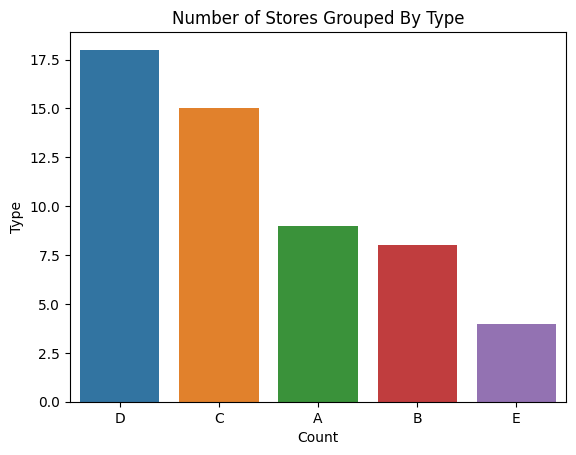

In [87]:
# Visualization of Store Type
sns.countplot(data=stores, x='type',
              order=stores.type.value_counts().index,)
plt.title('Number of Stores Grouped By Type')
plt.ylabel('Type')
plt.xlabel('Count')

Text(0.5, 0, 'Count')

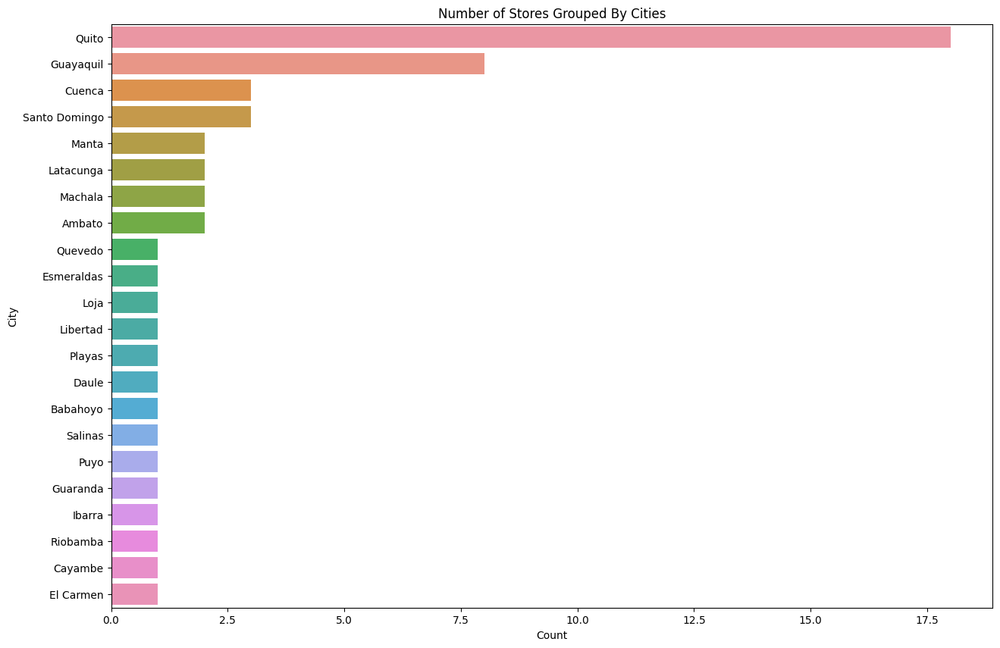

In [86]:
# Visualization of Store Type
plt.figure(figsize=(15, 10))
sns.countplot(data=stores, y='city', 
              order=stores.city.value_counts().index)
plt.title('Number of Stores Grouped By Cities')
plt.ylabel('City')
plt.xlabel('Count')

### Holiday

In [88]:
df_holidays

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
...,...,...,...,...,...,...
345,2017-12-22,Additional,National,Ecuador,Navidad-3,False
346,2017-12-23,Additional,National,Ecuador,Navidad-2,False
347,2017-12-24,Additional,National,Ecuador,Navidad-1,False
348,2017-12-25,Holiday,National,Ecuador,Navidad,False


## Monthly Sales for each product by year

In [63]:
# df_train.family.value_counts()

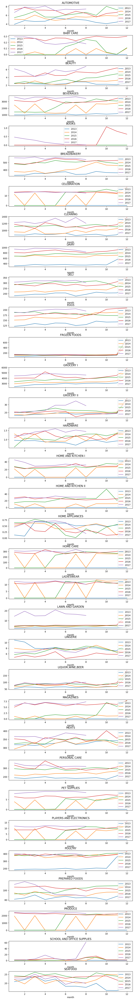

In [60]:
# create a figure with a fixed size
fig = plt.figure(figsize=(10, 80))

# adjust the space between subplots
fig.subplots_adjust(hspace=0.5)

# loop through each unique family in the dataframe
for i, family in enumerate(df_train.family.unique()):
    
    # add a subplot to the figure
    ax = fig.add_subplot(len(df_train.family.unique()), 1, i+1)
    
    # select rows of the dataframe with the current family
    select = df_train[df_train['family'] == family]
    
    # loop through each year and plot the mean sales for each month
    for year in [2013, 2014, 2015, 2016, 2017]:
        select[select['year'] == year].groupby('month')['sales'].mean().plot(ax=ax, label=year)
    
    # set the title of the subplot to the current family
    ax.set_title(family)
    
    # add a legend to the subplot
    ax.legend()


# Calculates the average sales for each day of the week

Text(0.5, 1.0, 'Average Sales by Day of week')

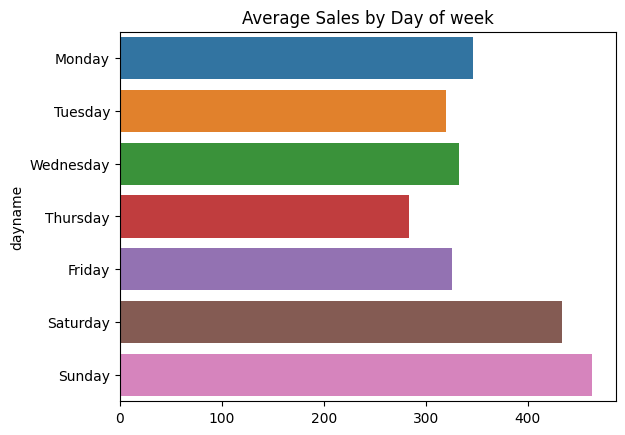

In [68]:
week = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

# Groups the sales data in the df_train dataframe by the day of the week and calculates the mean sales for each day.
mean_sales = df_train.groupby('dayname').sales.mean()[week]

sns.barplot(y=mean_sales.index, x=mean_sales.values)
plt.title('Average Sales by Day of week')

# Sales Average by Day of Month

Text(0.5, 1.0, 'Sales Average by Day of Month')

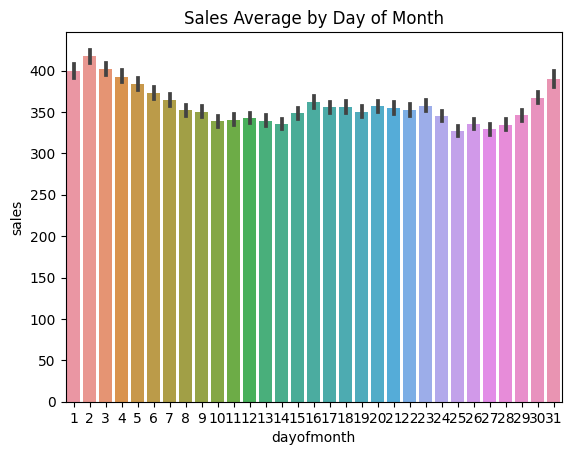

In [69]:
sns.barplot(x='dayofmonth', y='sales', data=df_train, estimator=np.mean)
plt.title('Sales Average by Day of Month')

# Transactions Data

In [70]:
# The transactions data ideally should correspond with the number of sales made per day in the train data

df_transactions.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


# Visualization of the Transactions of each Store

In [72]:
# sort the transactions by store number and date
sorted_transactions = df_transactions.sort_values(["store_nbr", "date"])

# create a line plot
fig = px.line(sorted_transactions, x='date', y='transactions', color='store_nbr',title='Transactions by Store')

fig.show()

# Merge train data with store, oil, and transactions data

In [28]:
df = pd.merge(train, stores, on='store_nbr', how='left')
df = pd.merge(df, oil, on='date', how='left')
df = pd.concat([df, df_transactions], axis=1)